In [1]:
import torch
import pandas as pd
import numpy as np
import utils as ut
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt
from rumex_model import RumexNet
from rumex_dataset import RumexDataset, train_loader, test_loader
from skimage import exposure
import skimage.io as sio
import itertools
from torchvision import transforms as T
from torchvision.datasets import ImageFolder
from torch.utils.data import Dataset, DataLoader
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

device = torch.device("cpu")

def display_image_grid(df, fpath):
    '''
    Given list of images display them in a grid
    '''
    nimages = len(df)
    ncols = 5
    nrows = np.ceil(nimages/ncols).astype(int)
    factor = np.max((np.floor(nrows/ncols).astype(int), 1))

        
    # fig, axarr = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20,40))
    fig, axarr = plt.subplots(nrows=nrows, ncols=ncols, figsize=(25, (factor+1)*20))    
    [axi.set_axis_off() for axi in axarr.ravel()] # set axis off for all axis
    for i in range(nimages):
        # rescale intensities
        row = df.iloc[i, :]
        fname = row['fname']
        im = sio.imread(fpath+fname)
        im = exposure.rescale_intensity(im)

        # plot image
        row = i // ncols
        col = i % ncols        
        axarr[row, col].imshow(im, aspect="auto")
        axarr[row, col].title.set_text(fname)
    plt.subplots_adjust(wspace=0.01, hspace=0.1, left = 0, right = 1, bottom = 0, top = 0.96)
    plt.show()
    return

In [2]:
bs = 32
model_name = 'densenet'
log_dir = 'logs/' + model_name
data_dir="/u/21/hiremas1/unix/postdoc/rumex/data256_for_training/train/"
ds = RumexDataset(data_dir, train_flag=False)
dl = test_loader(ds, bs)


# load best model, predictions and metrics
ckpt_dict = torch.load(log_dir + '/best.pt')
model = RumexNet(model_name)
model.load_state_dict(ckpt_dict["state_dict"])
del ckpt_dict

In [3]:
# pred = ckpt_dict['predictions']
# pred.keys()

# pred_cpu = {}
# pred_cpu['fname'] = pred['fname']
# pred_cpu['y'] = pred['y'].cpu().numpy()
# pred_cpu['yhat'] = pred['yhat'].cpu().numpy()
# pred_cpu['score'] = pred['score'].cpu().numpy()
# pred_cpu['loss'] = pred['loss'].cpu().numpy()
# del pred

# df = pd.DataFrame.from_dict(pred_cpu)

In [8]:
y_te = []
# loss_te = []
yhat_te = []
fname_te = []
loss_fn = nn.CrossEntropyLoss(reduction="none")
for xteb, yteb, idb, fnameb in dl:
    xteb = xteb.to(device)
    yteb = yteb.to(device)

    # Forward pass
    score_te_b = model(xteb)  # logits
    loss_te_b = loss_fn(score_te_b, yteb)
    _, yhat_te_b = torch.max(score_te_b, 1)

    # book keeping at batch level
    y_te.append(yteb)
#     loss_te.append(loss_te_b)
    yhat_te.append(yhat_te_b)
    fname_te.append(list(fnameb))

In [9]:
# predictions and  metrics
y_te = torch.cat(y_te).detach().numpy()
# loss_te = torch.cat(loss_te).numpy()
yhat_te = torch.cat(yhat_te).detach().numpy()
fname_te = list(itertools.chain(*fname_te))

pred = {"fname": fname_te,
        "y": y_te,
        "yhat": yhat_te,
#         "loss": loss_te
       }

df_pred = pd.DataFrame.from_dict(pred)

In [10]:
wrong_pred_as_rumex = df_pred[(df_pred.y==0) & (df_pred.yhat==1)]
wrong_pred_as_other = df_pred[(df_pred.y==1) & (df_pred.yhat==0)]
print(wrong_pred_as_rumex.shape)
print(wrong_pred_as_other.shape)

(58, 3)
(19, 3)


In [11]:
wrong_pred_as_rumex.sort_values("fname", inplace=True)
wrong_pred_as_other.sort_values("fname", inplace=True)

/u/21/hiremas1/unix/anaconda3/envs/pytorch/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/u/21/hiremas1/unix/anaconda3/envs/pytorch/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


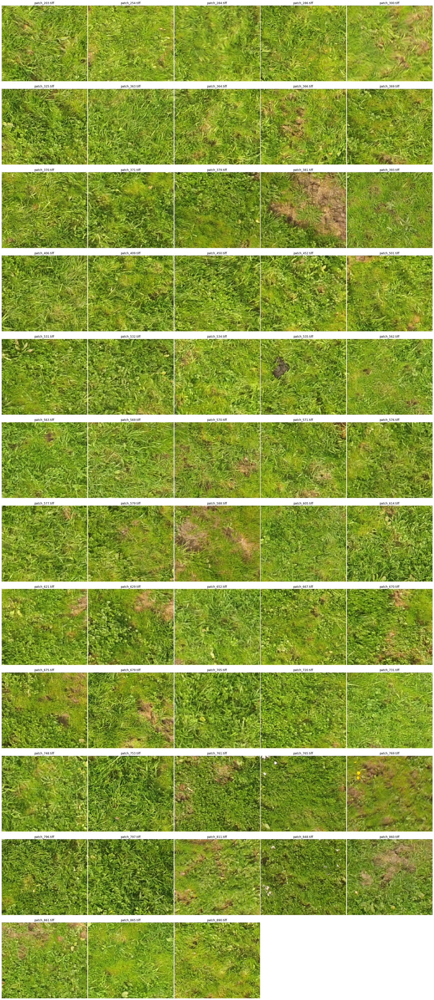

In [12]:
display_image_grid(wrong_pred_as_rumex, data_dir + "other/")

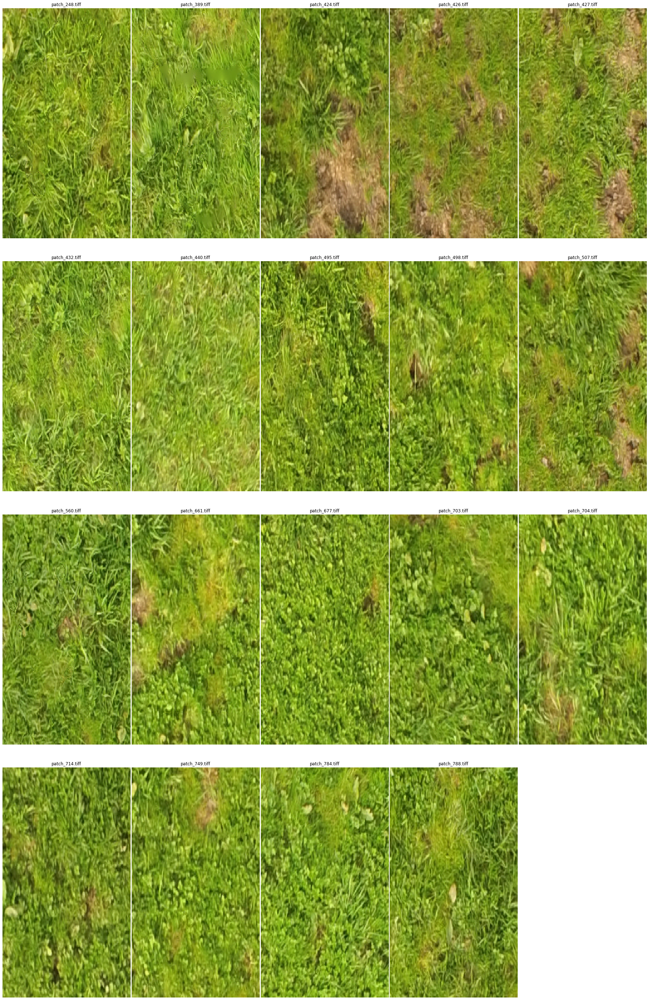

In [13]:
display_image_grid(wrong_pred_as_other, data_dir + "rumex/")